In [111]:
library(tidyverse)
library(plotly)
library(data.table)

Warning message:
"package 'data.table' was built under R version 3.3.2"------------------------------------------------------------------------------
data.table + dplyr code now lives in dtplyr.
Please library(dtplyr)!
------------------------------------------------------------------------------

Attaching package: 'data.table'

The following objects are masked from 'package:lubridate':

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from 'package:dplyr':

    between, first, last

The following object is masked from 'package:purrr':

    transpose



In [112]:
ufo <- fread("../data/ufo_scrubbed.csv")

Warning message in fread("../data/ufo_scrubbed.csv"):
"Bumped column 6 to type character on data row 27823, field contains '2`'. Coercing previously read values in this column from logical, integer or numeric back to character which may not be lossless; e.g., if '00' and '000' occurred before they will now be just '0', and there may be inconsistencies with treatment of ',,' and ',NA,' too (if they occurred in this column before the bump). If this matters please rerun and set 'colClasses' to 'character' for this column. Please note that column type detection uses a sample of 1,000 rows (100 rows at 10 points) so hopefully this message should be very rare. If reporting to datatable-help, please rerun and include the output from verbose=TRUE."Warning message in fread("../data/ufo_scrubbed.csv"):
"Bumped column 10 to type character on data row 43783, field contains '33q.200088'. Coercing previously read values in this column from logical, integer or numeric back to character which may not 

In [58]:
names(ufo)

[1] "datetime"             "city"                 "state"               
 [4] "country"              "shape"                "duration..seconds."  
 [7] "duration..hours.min." "comments"             "date.posted"         
[10] "latitude"             "longitude"

In [59]:
ufo <- ufo %>% mutate(country = case_when(
                                    .$country == '' ~ 'na',
                                    TRUE ~ as.character(.$country)) )

In [99]:
ufo %>% head(3)

,datetime,city,state,country,shape,duration..seconds.,duration..hours.min.,comments,date.posted,latitude,longitude
1,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 1949-50. It occurred after a Boy Scout meeting in the Baptist Church. The Baptist Church sit,4/27/2004,29.8830556,-97.9411111
2,10/10/1949 21:00,lackland afb,tx,,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing across the sky &amp; making 90 degree turns on a dime.,12/16/2005,29.38421,-98.581082
3,10/10/1955 17:00,chester (uk/england),,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 England,1/21/2008,53.2,-2.916667


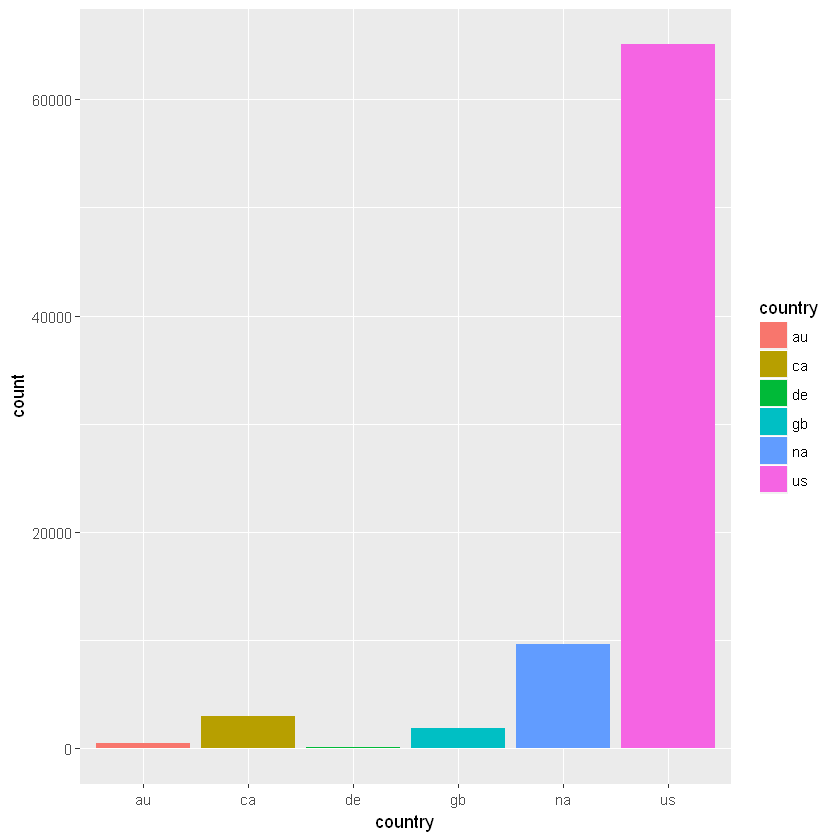

In [61]:
ufo %>% ggplot(aes(x = country, fill = country)) + geom_bar()

In [62]:
{ufo %>% mutate(duration_secs = as.numeric(duration..seconds.)
              ,duration_mins = as.numeric(duration..seconds.)/60 ) %>% ggplot(aes(duration_mins)) + geom_density()} %>% ggplotly

HTML widgets cannot be represented in plain text (need html)

Warning message:
"Ignoring unknown parameters: bins"

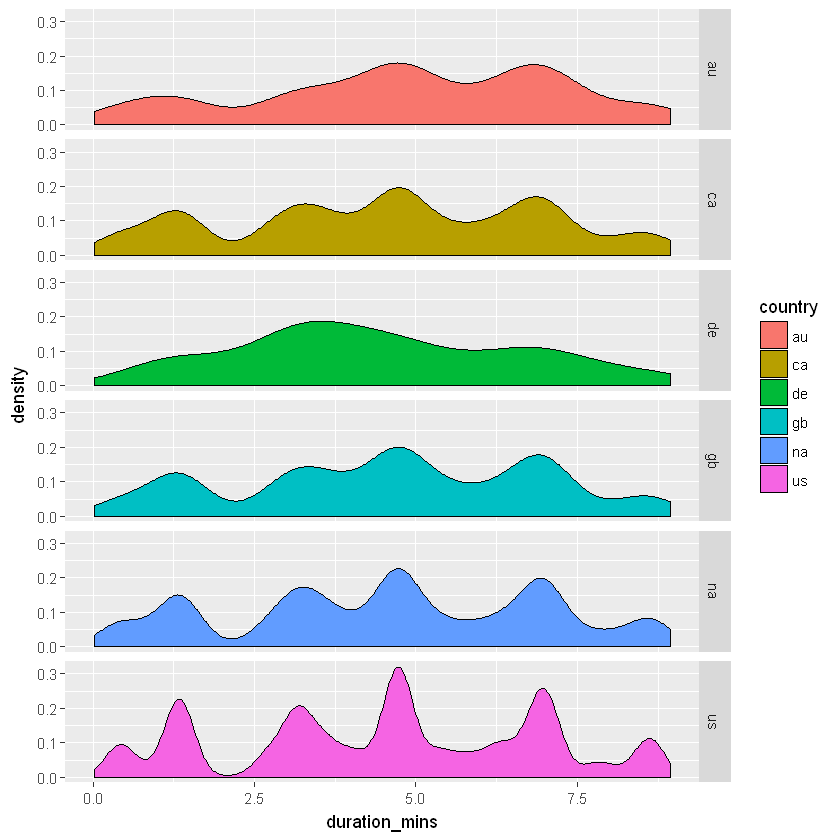

In [63]:
ufo <- ufo %>% mutate(duration_secs = as.numeric(duration..seconds.)
              ,duration_mins = as.numeric(duration..seconds.)/60 )

ufo %>% 
ggplot(aes(x = duration_mins, fill = country)) +
    geom_density(bins = 15, position = "stack") +
    facet_grid(country ~ .)

In [64]:
library(lubridate)

In [65]:
ufo <- ufo %>% mutate( weeks_between_events = difftime(time1 = date(mdy(date.posted)), time2= date(mdy_hm(datetime)), units = 'weeks') ) %>% as.data.frame

Warning message:
"Ignoring unknown parameters: nbins"Don't know how to automatically pick scale for object of type difftime. Defaulting to continuous.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


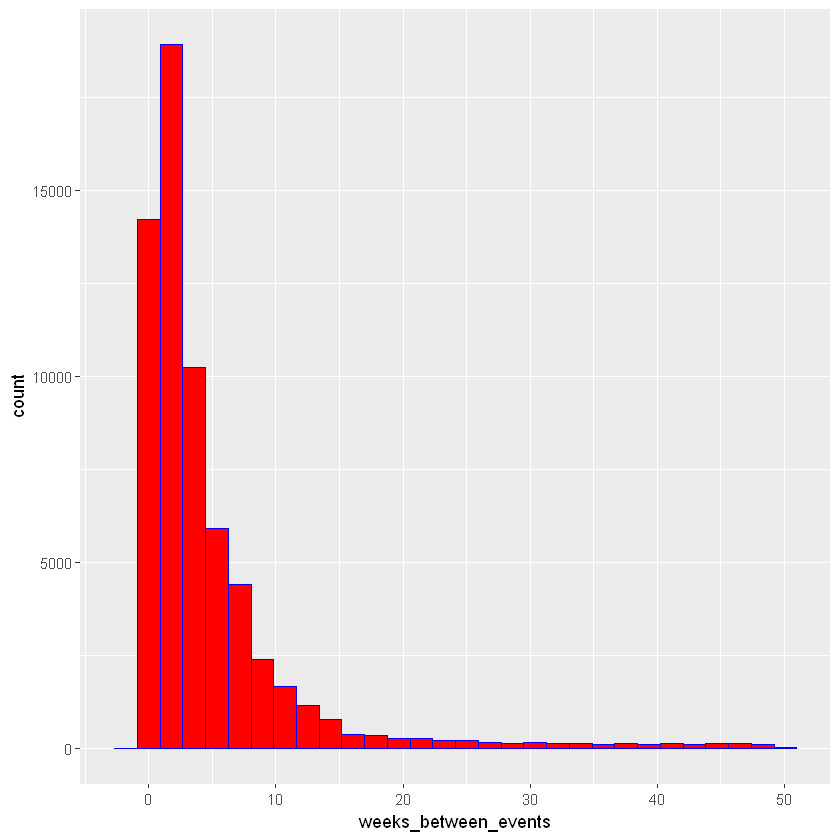

In [66]:
ufo %>% filter(weeks_between_events < 50) %>%
ggplot(aes(weeks_between_events)) + geom_histogram(nbins = 50, fill = "red", color = "blue")

In [70]:
median(as.numeric(ufo$weeks_between_events), na.rm = T)

[1] 3.857143

In [73]:
names(ufo)

[1] "datetime"             "city"                 "state"               
 [4] "country"              "shape"                "duration..seconds."  
 [7] "duration..hours.min." "comments"             "date.posted"         
[10] "latitude"             "longitude"            "duration_secs"       
[13] "duration_mins"        "weeks_between_events"

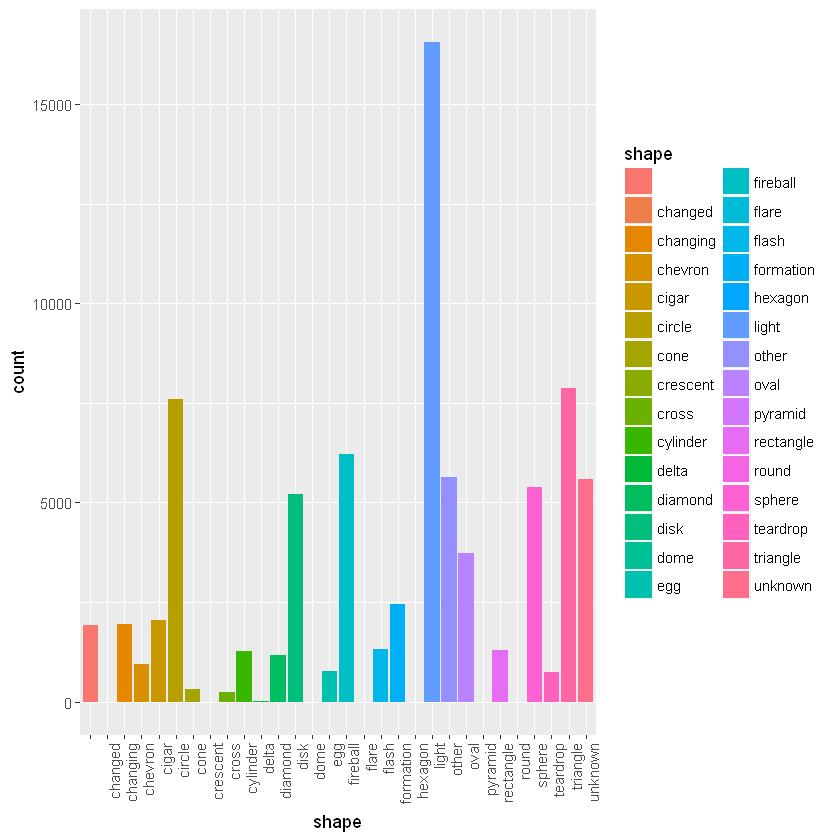

In [77]:
ufo %>% 
ggplot(aes(x = shape, fill = shape)) + geom_bar() + theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [78]:
ufo %>% group_by(shape) %>% summarise(
    count = n()
) %>% 
arrange(desc(count)) %>% head(10)

,shape,count
1,light,16565
2,triangle,7865
3,circle,7608
4,fireball,6208
5,other,5649
6,unknown,5584
7,sphere,5387
8,disk,5213
9,oval,3733
10,formation,2457


Warning message:
"Removed 1 rows containing missing values (geom_point)."

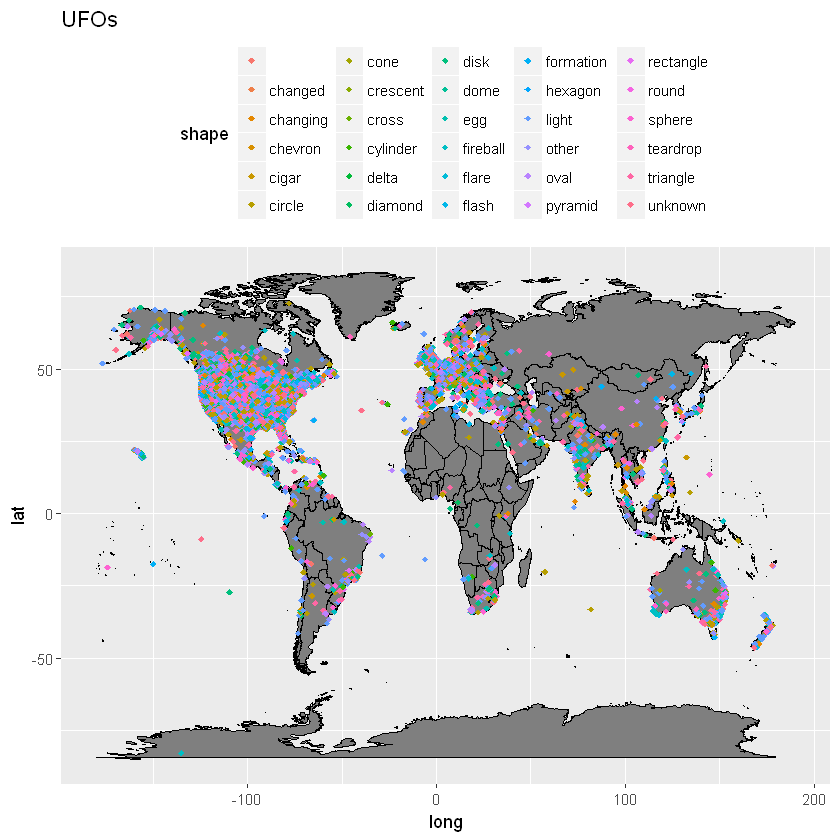

In [122]:
ufo$latitude <- as.numeric(ufo$latitude)

map <- borders("world", colour="black", fill="gray50") 
ufo_map <- ggplot(ufo) + map 

ufo_map + geom_point(aes(x=as.numeric(ufo$longitude), y=as.numeric(ufo$latitude),color=shape),shape=18) +
        theme(legend.position = "top")+
        ggtitle("UFOs") 

# Aliens in the USA!

In [131]:

{ufo %>% filter( longitude > -130 & longitude < -60 ) %>%
ggplot(aes(x=as.numeric(.$longitude), y=as.numeric(.$latitude))) + map + geom_density_2d() } %>% ggplotly

Warning message:
"Removed 1 rows containing non-finite values (stat_density2d)."

HTML widgets cannot be represented in plain text (need html)

# Aliens in london!

In [133]:

{ufo %>% filter( longitude > -30 & longitude < 150 ) %>%
ggplot(aes(x=as.numeric(.$longitude), y=as.numeric(.$latitude))) + map + geom_density_2d() } %>% ggplotly

HTML widgets cannot be represented in plain text (need html)

In [115]:
ufo <- ufo %>% mutate(new_lat = as.numeric(latitude) )

Warning message in eval(substitute(expr), envir, enclos):
"NAs introduced by coercion"

In [116]:
ufo %>% head(10)

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,new_lat
1,10/10/1949 20:30,san marcos,tx,us,cylinder,2700.000,45 minutes,This event took place in early fall around 1949-50. It occurred after a Boy Scout meeting in the Baptist Church. The Baptist Church sit,4/27/2004,29.883056,-97.9411111,29.883056
2,10/10/1949 21:00,lackland afb,tx,,light,7200.000,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing across the sky &amp; making 90 degree turns on a dime.,12/16/2005,29.384210,-98.581082,29.38421
3,10/10/1955 17:00,chester (uk/england),,gb,circle,20.000,20 seconds,Green/Orange circular disc over Chester&#44 England,1/21/2008,53.200000,-2.916667,53.2
4,10/10/1956 21:00,edna,tx,us,circle,20.000,1/2 hour,My older brother and twin sister were leaving the only Edna theater at about 9 PM&#44...we had our bikes and I took a different route home,1/17/2004,28.978333,-96.6458333,28.978333
5,10/10/1960 20:00,kaneohe,hi,us,light,900.000,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/attack aircraft on a solo night exercise&#44 I was at 50&#44000&#39 in a &quot;clean&quot; aircraft (no ordinan,1/22/2004,21.418056,-157.8036111,21.418056
6,10/10/1961 19:00,bristol,tn,us,sphere,300.000,5 minutes,My father is now 89 my brother 52 the girl with us now 51 myself 49 and the other fellow which worked with my father if he&#39s still livi,4/27/2007,36.595000,-82.1888889,36.595
7,10/10/1965 21:00,penarth (uk/wales),,gb,circle,180.000,about 3 mins,penarth uk circle 3mins stayed 30ft above me for 3 mins slowly moved of and then with the blink of the eye the speed was unreal,2/14/2006,51.434722,-3.18,51.434722
8,10/10/1965 23:45,norwalk,ct,us,disk,1200.000,20 minutes,A bright orange color changing to reddish color disk/saucer was observed hovering above power transmission lines.,10/2/1999,41.117500,-73.4083333,41.1175
9,10/10/1966 20:00,pell city,al,us,disk,180.000,3 minutes,Strobe Lighted disk shape object observed close&#44 at low speeds&#44 and low altitude in Oct 1966 in Pell City Alabama,3/19/2009,33.586111,-86.2861111,33.586111
10,10/10/1966 21:00,live oak,fl,us,disk,120.000,several minutes,Saucer zaps energy from powerline as my pregnant mother receives mental signals not to pass info,5/11/2005,30.294722,-82.9841667,30.294722


# Are triangles more prevalent or less prevalent now?

In [157]:
{ufo %>% mutate( year_of_observation = year(lubridate::mdy_hm(datetime)) ) %>% 
filter(year_of_observation != 2014, ! shape %in% c('light','fireball'), country=='us' ) %>% 
group_by(year_of_observation) %>% summarise(
    proportion_triangles = sum(ifelse(shape == 'triangle',1,0)) / n()
) %>% 
ggplot(aes(x = year_of_observation, y = proportion_triangles)) + geom_point() + theme(axis.text.x = element_text(angle = 90, hjust = 5) )} %>% ggplotly

HTML widgets cannot be represented in plain text (need html)

### Triangles peaked roughly when stealth aircraft were used in the first gulf war

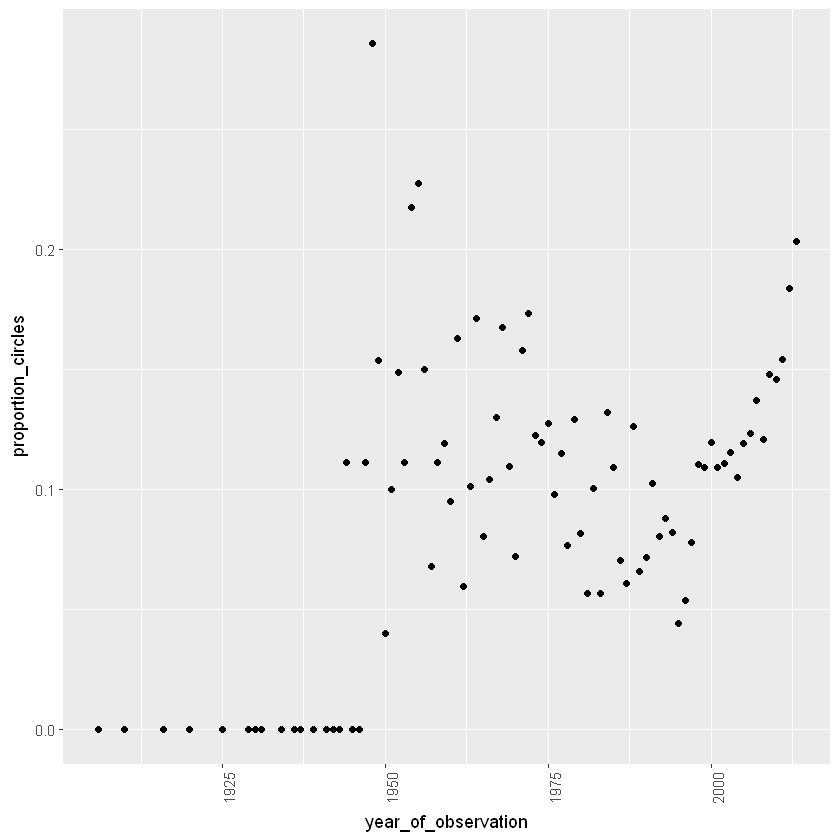

In [161]:
ufo %>% mutate( year_of_observation = year(lubridate::mdy_hm(datetime)) ) %>% 
filter(year_of_observation != 2014, ! shape %in% c('light','fireball') ) %>% 
group_by(year_of_observation) %>% summarise(
    proportion_circles = sum(ifelse(shape == 'circle',1,0)) / n()
) %>% 
ggplot(aes(x = year_of_observation, y = proportion_circles)) + geom_point() + theme(axis.text.x = element_text(angle = 90, hjust = 5) )